In [ ]:


import pandas as pd
import numpy as np
import logging
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, LSTM, concatenate
from tensorflow.keras.optimizers import Adam

logging.getLogger("tensorflow").setLevel(logging.ERROR)

In [18]:
def grade(score):
    if score >= 90: return "A"
    if score >= 80: return "B"
    if score >= 70: return "C"
    if score >= 60: return "D"
    return "F"

In [19]:



#Grading for scoioeconomic features, note this approach isn't perfect giving the scale being used 0-100
#Note in things like unemployment this will always result in an F, because percent wise to my knowledge 
#unemployment rate is < 10 and thus when applying grading wi,l result in a score less than 10 and thus an F
def apply_socioeconomic_grades(df):
    grade_cols = {
        "Poverty_Score": "Poverty_Grade",
        "Income_Score": "Income_Grade",
        "RuralUrban_Score": "RuralUrban_Grade",
        "UrbanInfluence_Score": "UrbanInfluence_Grade",
        "Unemployment_Score": "Unemployment_Grade",
        "SocioEconomic_Score": "SocioEconomic_Grade",
    }

    for score_col, grade_col in grade_cols.items():
        df[grade_col] = df[score_col].apply(grade)

    return df

In [20]:
# a model that takes both static and time series features, this is useful given use a 48 month window or about 4 years
#worth of data to understand housing data and seasonal trends
#We ise crime school score, and population to help predict housing prices as stated in the next cell 

def build_model(n_past, n_ts_features, n_static_features, n_future):
    ts_in = Input(shape=(n_past, n_ts_features), name="ts_input") #(48,1) shape per sample
    x = LSTM(64, return_sequences=False)(ts_in)#reading though the months in order learning trends / seasonality patterns
    x = Dropout(0.25)(x) #drop 25% of neurons during trainging to reduce over fitting which happens fairly quickli here 
    ts_out = Dense(32, activation="relu")(x)

    static_in = Input(shape=(n_static_features,), name="static_input")
    s = Dense(128, activation="relu")(static_in) #learning of non linear relationships, basically how these features interact with one another
    s = Dropout(0.2)(s)#dropoout again so as to rediuce over fitting
    s = Dense(64, activation="relu")(s)
    static_out = Dense(32, activation="relu")(s) #same as our ts_input

    combined = concatenate([ts_out, static_out]) #creates a 64 dim vector which is a joint representation of both ts and static
    z = Dense(64, activation="relu")(combined)
    output = Dense(n_future)(z)# predicted future home prices

    model = Model(inputs=[ts_in, static_in], outputs=output) #take both and produce an output/prediction
    model.compile(optimizer=Adam(0.001), loss="mse", metrics=["mae"])

    return model



In [121]:

#main, lol
def main():

    #Loading data set with fixed Fips for counties
    #When merging states begining with a 0 fips like Alabama California etc lost the initial leading zero
    #And weren't represented on the map and thus the dataset had to be altered
    df = pd.read_csv("StatesFixed.csv")
    df.columns = df.columns.str.strip()
    print("Loaded:", df.shape)

    # add grade columns for ec0nomic features
    df = apply_socioeconomic_grades(df)

    #For every cloumn name we search to see if pandas can convert it into a date
    #if it can its a ts column
    date_cols = []
    for col in df.columns:
        try:
            pd.to_datetime(col, errors="raise")
            date_cols.append(col)
        except:
            pass
    #remove all non time series columns, that aren't dates like unemployment for an example can be mistaken
    #as one given the year etc so we simply remove that 
    remove_non_ts = [
        "RegionID","SizeRank","RegionName","RegionType","StateName","State","City","Metro",
        "CountyName","CountyName_clean","crime_rate_per_100000","population","FIPS",
        "CountySchoolScore_y","PCTPOVALL_2023","MEDHHINC_2023",
        "Rural_Urban_Continuum_Code_2023","Urban_Influence_Code_2024",
        "Unemployment_rate_2019","Unemployment_rate_2020","Unemployment_rate_2021",
        "Unemployment_rate_2022","Unemployment_rate_2023",
        "Poverty_Score","Income_Score","RuralUrban_Score","UrbanInfluence_Score",
        "Unemployment_Mean","Unemployment_Trend","Unemployment_Score",
        "SocioEconomic_Score",
        "Poverty_Grade","Income_Grade","RuralUrban_Grade","UrbanInfluence_Grade",
        "Unemployment_Grade","SocioEconomic_Grade"
    ]
    #sorting through remaining columns / dates chronologically
    date_cols = [c for c in date_cols if c not in remove_non_ts]
    date_cols = sorted(date_cols, key=lambda x: pd.to_datetime(x))
    ##let us see how many we have left
    print(f"found {len(date_cols)} time series columns.")

    #We use 48 months of historic data in chronological order for LSTM
    N_PAST = 48
    #Predict 12 months into the future
    N_FUTURE = 12
    #1 feature a month
    N_TS_FEAT = 1

    #Makes sure we have enough months to be able to do this 
    if len(date_cols) < N_PAST + N_FUTURE:
        print("ERROR: Not enough months.")
        return
    #getting the total months we used whcih depending on what you use for N_PAST and N_FUTURE is this total combined
    ts_cols = date_cols[-(N_PAST + N_FUTURE):]
    #creating the input and target window i.e the prediction window we're trying to predict for 
    ts_input_cols = ts_cols[:N_PAST]
    ts_target_cols = ts_cols[N_PAST:]

    #static features non time series
    categorical_static = ["State", "Metro", "CountyName_clean"]
    #
    numerical_static = [
        "SizeRank",
        "crime_rate_per_100000",
        "population",
        "CountySchoolScore_y",

        # NEW SOCIOECONOMIC FEATURES
        "Poverty_Score",
        "Income_Score",
        "RuralUrban_Score",
        "UrbanInfluence_Score",
        "Unemployment_Mean",
        "Unemployment_Trend",
        "Unemployment_Score",
        "SocioEconomic_Score"
    ]

    static_features = categorical_static + numerical_static

    # dropping all of the rows that are missing any required data for example some houses don't have data before a certain
    #date because they simply didn't exist including those in the model would introduce zeros or nan's and would add noise
    #rather than help make a prediction
    df = df.dropna(subset=ts_input_cols + ts_target_cols + static_features)
    df.reset_index(drop=True, inplace=True)

    
    #building of the matrices necessary for LSTM
    X_ts = df[ts_input_cols].values.reshape(-1, N_PAST, N_TS_FEAT)
    y = df[ts_target_cols].values #getting target values for prediction
    X_static_df = df[static_features] 

    # scale time series and target / normalizing them 
    ts_scaler = StandardScaler()
    y_scaler = StandardScaler()

    X_ts_scaled = ts_scaler.fit_transform(df[ts_input_cols]).reshape(-1, N_PAST, N_TS_FEAT)
    y_scaled = y_scaler.fit_transform(y)

    #numeric , categorical, and one hot encoding
    numeric_trans = Pipeline([("scaler", StandardScaler())])
    cat_trans = Pipeline([("onehot", OneHotEncoder(handle_unknown="ignore"))])
    #combined into a singular transformer
    static_preprocessor = ColumnTransformer(
        transformers=[
            ("num", numeric_trans, numerical_static),
            ("cat", cat_trans, categorical_static)
        ]
    )

    #train / test split for both time series and static 
    (X_static_train_df, X_static_test_df,
     X_ts_train, X_ts_test,
     y_train, y_test) = train_test_split(
        X_static_df,
        X_ts_scaled,
        y_scaled,
        test_size=0.2,
        random_state=42
    )

    # fit static transformer 
    X_static_train = static_preprocessor.fit_transform(X_static_train_df)
    X_static_test = static_preprocessor.transform(X_static_test_df)

    N_STATIC = X_static_train.shape[1]

    #build and training of the model 
    model = build_model(N_PAST, N_TS_FEAT, N_STATIC, N_FUTURE)
    model.summary()

    history = model.fit(
        [X_ts_train, X_static_train],
        y_train,
        validation_data=([X_ts_test, X_static_test], y_test),
        epochs=10,
        batch_size=32,
        verbose=1
    )

    #evaluating the model and predicting
    test_loss, test_mae = model.evaluate([X_ts_test, X_static_test], y_test, verbose=0)
    print(f"\nTest MSE: {test_loss:.4f} | MAE: {test_mae:.4f}")

    # example prediction
    pred_scaled = model.predict([X_ts_test, X_static_test])
    pred = y_scaler.inverse_transform(pred_scaled)
    true = y_scaler.inverse_transform(y_test)

    print("\nExample actual vs predicted (first sample):")
    print("Actual:", true[0])
    print("Predicted:", pred[0])
    


    #Used to make predictions outside of main instead of retraining the model everytime we want to predict housing
    #Prices in a county
    return df, model, ts_input_cols, ts_target_cols, static_features, ts_scaler, y_scaler, static_preprocessor



In [122]:
#Make these values global such that we can use them when we're
df, model, ts_input_cols, ts_target_cols, static_features, ts_scaler, y_scaler, static_preprocessor = main()


Loaded: (26310, 340)
found 309 time series columns.


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ static_input        │ (None, 2274)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ ts_input            │ (None, 48, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_97 (Dense)    │ (None, 128)       │    291,200 │ static_input[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_16 (LSTM)      │ (None, 64)        │     16,896 │ ts_input[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_33          │ (None, 128)       │          0 │ dense_97[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_32          │ (None, 64)        │          0 │ lstm_16[0][0]     │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_98 (Dense)    │ (None, 64)        │      8,256 │ dropout_33[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_96 (Dense)    │ (None, 32)        │      2,080 │ dropout_32[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_99 (Dense)    │ (None, 32)        │      2,080 │ dense_98[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_16      │ (None, 64)        │          0 │ dense_96[0][0],   │
│ (Concatenate)       │                   │            │ dense_99[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_100 (Dense)   │ (None, 64)        │      4,160 │ concatenate_16[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_101 (Dense)   │ (None, 12)        │        780 │ dense_100[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 325,452 (1.24 MB)

 Trainable params: 325,452 (1.24 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
485/485 ━━━━━━━━━━━━━━━━━━━━ 10s 15ms/step - loss: 0.2398 - mae: 0.1874 - val_loss: 0.0023 - val_mae: 0.0297
Epoch 2/10
485/485 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 0.0171 - mae: 0.0612 - val_loss: 0.0052 - val_mae: 0.0296
Epoch 3/10
485/485 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 0.0149 - mae: 0.0599 - val_loss: 0.0024 - val_mae: 0.0239
Epoch 4/10
485/485 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 0.0103 - mae: 0.0527 - val_loss: 0.0024 - val_mae: 0.0326
Epoch 5/10
485/485 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 0.0099 - mae: 0.0536 - val_loss: 0.0035 - val_mae: 0.0301
Epoch 6/10
485/485 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 0.0151 - mae: 0.0624 - val_loss: 0.0044 - val_mae: 0.0258
Epoch 7/10
485/485 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 0.0106 - mae: 0.0497 - val_loss: 0.0025 - val_mae: 0.0256
Epoch 8/10
485/485 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 0.0102 - mae: 0.0509 - val_loss: 0.0018 - val_mae: 0.0230
Epoch 9/10
485/485 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def predict_for_fips(df, fips_code, model, plot=False):
    #fips must always be 5 digits including the state code and the county code example ca state code is 06
    # and LA county is 037
    fips_str = str(fips_code).zfill(5)

    # find the row for this county
    row = df[df["FIPS"] == fips_str]
    #debug incase no row with that fip exists 
    if row.empty:
        print(f"County with FIPS {fips_str} not found.")
        return
    #extrace first and matching row
    row = row.iloc[0]  # Series
    # Get clean county and state names
    county = row.get("CountyName", "")
    state = row.get("StateName", "")


    #use the same number of months this model was trained on
    N_PAST = len(ts_input_cols)
    
    N_FUTURE = len(ts_target_cols)

    #scale and series input making it the shape the model would expect
    ts_vals = row[ts_input_cols].values.astype(float).reshape(1, -1)
    
    ts_scaled = ts_scaler.transform(ts_vals).reshape(1, N_PAST, 1)

    #same concept for the static features of the model 
    static_vals = row[static_features].to_frame().T
    
    static_scaled = static_preprocessor.transform(static_vals)

    #running the model prediction
    pred_scaled = model.predict([ts_scaled, static_scaled])
    
    pred = y_scaler.inverse_transform(pred_scaled)[0]  # convert back to dollars

    #getitng the actual dollar amount 
    actual = row[ts_target_cols].values.astype(float)

    # percent error along with average absolute percent error
    percent_errors = ((pred - actual) / actual) * 100
    mape = np.mean(np.abs(percent_errors))

    # we want dollars on the graph so a formatting helper is used 
    fmt = lambda x: f"${x:,.0f}"

    # ----------------------
    # Print results cleanly
    
    print(f"\nPrediction for county FIPS {fips_str}")

    print("\nActual next months:")
    print([fmt(v) for v in actual])

    print("\nPredicted next months:")
    print([fmt(v) for v in pred])

    print("\nPercent error (%):")
    print([round(v, 2) for v in percent_errors])


    #optional graph to be ran just set plot = True if you want a graph
    if plot:
        #x axis for how many months we're forecasting in this case 12 or a year
        months = list(range(1, N_FUTURE + 1))

        plt.figure(figsize=(8, 4))
        #actual value 
        plt.plot(months, actual, label="Actual", marker='o')
        #Predicted value
        plt.plot(months, pred, label="Predicted", marker='o')

        plt.title(f"{county}, {state}  Actual vs Predicted Housing Prices\n"f"FIPS {fips_str} | MAPE = {mape:.2f}%") #title with county and state name

        plt.xlabel("Months Ahead")
        plt.ylabel("Price (USD)")

        # Dollar formatting for y-axis
        def dollar_fmt(x, pos):
            return f'${x:,.0f}'

        plt.gca().yaxis.set_major_formatter(FuncFormatter(dollar_fmt))

        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    


/opt/anaconda3/envs/dl/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step

Prediction for county FIPS 06037

Actual next months:
['$607,229', '$611,912', '$615,558', '$614,840', '$610,299', '$601,339', '$594,158', '$588,039', '$584,695', '$584,953', '$588,277', '$593,013']

Predicted next months:
['$599,117', '$596,178', '$594,513', '$594,552', '$592,865', '$596,897', '$588,194', '$578,560', '$580,611', '$583,743', '$583,966', '$585,556']

Percent error (%):
[np.float64(-1.34), np.float64(-2.57), np.float64(-3.42), np.float64(-3.3), np.float64(-2.86), np.float64(-0.74), np.float64(-1.0), np.float64(-1.61), np.float64(-0.7), np.float64(-0.21), np.float64(-0.73), np.float64(-1.26)]


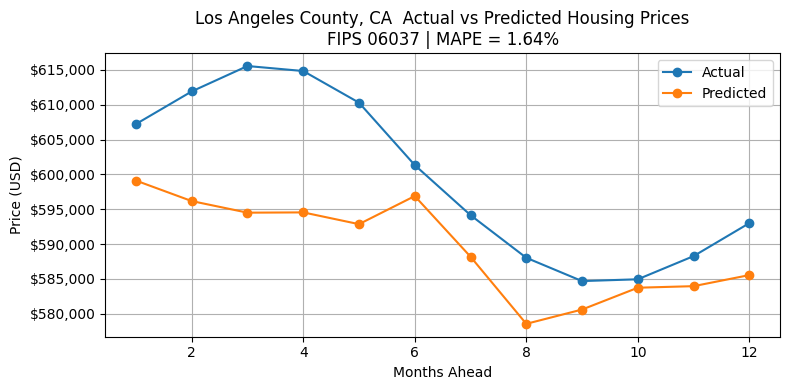

In [107]:
# Los Angeles County, CA (FIPS 06037)
predict_for_fips(df, "06037", model,plot = True)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


/opt/anaconda3/envs/dl/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names




Prediction for county FIPS 06001

Actual next months:
['$889,798', '$887,347', '$885,695', '$883,112', '$878,803', '$872,990', '$866,240', '$857,753', '$847,962', '$838,498', '$829,501', '$823,282']

Predicted next months:
['$892,581', '$909,837', '$902,489', '$885,998', '$889,436', '$883,345', '$880,912', '$867,415', '$864,797', '$854,875', '$854,621', '$843,018']

Percent error (%):
[np.float64(0.31), np.float64(2.53), np.float64(1.9), np.float64(0.33), np.float64(1.21), np.float64(1.19), np.float64(1.69), np.float64(1.13), np.float64(1.99), np.float64(1.95), np.float64(3.03), np.float64(2.4)]


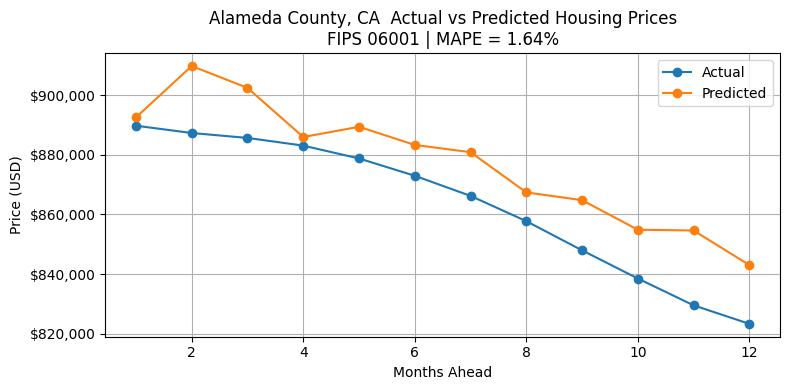

In [108]:
# Alameda County, CA (FIPS 06001)
predict_for_fips(df, "06001", model,plot = True)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


/opt/anaconda3/envs/dl/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names




Prediction for county FIPS 53001

Actual next months:
['$329,979', '$330,396', '$331,962', '$333,883', '$335,693', '$336,653', '$337,496', '$338,584', '$339,511', '$340,196', '$340,348', '$340,587']

Predicted next months:
['$339,407', '$341,494', '$340,503', '$341,909', '$346,566', '$341,238', '$346,549', '$341,169', '$344,738', '$341,460', '$343,058', '$340,574']

Percent error (%):
[np.float64(2.86), np.float64(3.36), np.float64(2.57), np.float64(2.4), np.float64(3.24), np.float64(1.36), np.float64(2.68), np.float64(0.76), np.float64(1.54), np.float64(0.37), np.float64(0.8), np.float64(-0.0)]


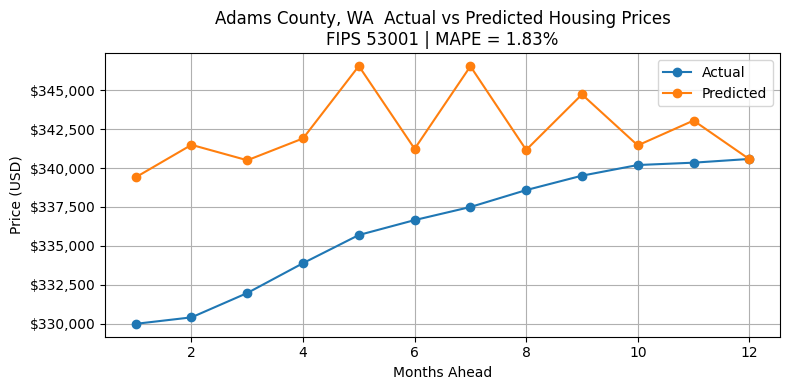

In [110]:
# Asotin County, WA (FIPS 53001)
predict_for_fips(df, "53001", model,plot = True)



In [91]:
import pandas as pd
import json
import plotly.express as px

#load the dataset in and fips as a string to not lose leading zeros
df = pd.read_csv("StatesFixed.csv", dtype={"FIPS": str})
df.columns = df.columns.str.strip()
df["FIPS"] = df["FIPS"].astype(str).str.strip()

#removing trailing zeros sometimes well get 06037.0 which causes errors 
df["FIPS"] = df["FIPS"].str.replace(".0", "", regex=False)

#replace all missing or incorrect values
df["FIPS"] = df["FIPS"].replace(["", "nan", "None", ".", "NA", "NaN", " ", "  "], pd.NA)

#anything invalid becomes NaN
df["FIPS"] = pd.to_numeric(df["FIPS"], errors="coerce")
# drop rows with an invalid fips
df = df.dropna(subset=["FIPS"])

# convert to integer safely
df["FIPS"] = df["FIPS"].astype(int)

# finally conver it back to a proper string
df["FIPS"] = df["FIPS"].astype(str).str.zfill(5)


In [92]:
#take a tow in pandas and converts to a percentile score i.e 0-100
def percentile(series, invert=False):
    #rank the rows and into percentiles
    score = pd.qcut(series.rank(method="first"), 100, labels=False, duplicates="drop")
    score = score.astype(float) #convert to float

    if invert:
        score = 100 - score

    return score
#note we have to invert for things like crime


In [93]:
def compute_economic_score(df):
    #High poverty is bad so we invert it 
    df["Poverty_Score_Norm"] = percentile(df["PCTPOVALL_2023"], invert=True)
    #high income is good we we dont invert
    df["Income_Score_Norm"] = percentile(df["MEDHHINC_2023"], invert=False)
    #high unemployment is bad so we invert it 
    df["Unemployment_Score_Norm"] = percentile(df["Unemployment_Mean"], invert=True)
    #condense it into one solid score
    df["Economic_Score"] = (df["Poverty_Score_Norm"] +df["Income_Score_Norm"] + df["Unemployment_Score_Norm"] ) / 3

    return df


In [94]:
#takes a raw value and compare it to every other value and ranks it 1 being the lowest and 99 being the highest
def quantile_score(series):
    return pd.qcut(series, 100, labels=False, duplicates="drop")


In [101]:
#building an over all county score based on several and returns a final letter grade
def build_overall_scores(df):

    # saferty lower crime is better
    df["Safety_Score"] = percentile(df["crime_rate_per_100000"], invert=True)

    # schools the higher the better
    df["School_Score"] = percentile(df["CountySchoolScore_y"], invert=False)

    # enconomic factors similar to reasons above 
    df["Poverty_Score_Norm"] = percentile(df["PCTPOVALL_2023"], invert=True)
    df["Income_Score_Norm"] = percentile(df["MEDHHINC_2023"], invert=False)
    df["Unemployment_Score_Norm"] = percentile(df["Unemployment_Mean"], invert=True)

    df["Economic_Score"] = (
        df["Poverty_Score_Norm"] +
        df["Income_Score_Norm"] +
        df["Unemployment_Score_Norm"]
    ) / 3

    #socio economic composit
    df["Socioeconomic_Score_Norm"] = percentile(df["SocioEconomic_Score"], invert=False)

    #final weighted overall 
    df["Overall_Score"] = (0.40 * df["Safety_Score"] +0.30 * df["School_Score"] +0.20 * df["Economic_Score"] +0.10 * df["Socioeconomic_Score_Norm"])

    # Convert to A–F
    df["Overall_Grade"] = df["Overall_Score"].apply(grade)

    return df




In [103]:
df = pd.read_csv("StatesFixed.csv")
df.columns = df.columns.str.strip()

# add your existing socioeconomic grades
df = compute_economic_score(df)
# add Safety, School, and Overall scores/grades
df = build_overall_scores(df)


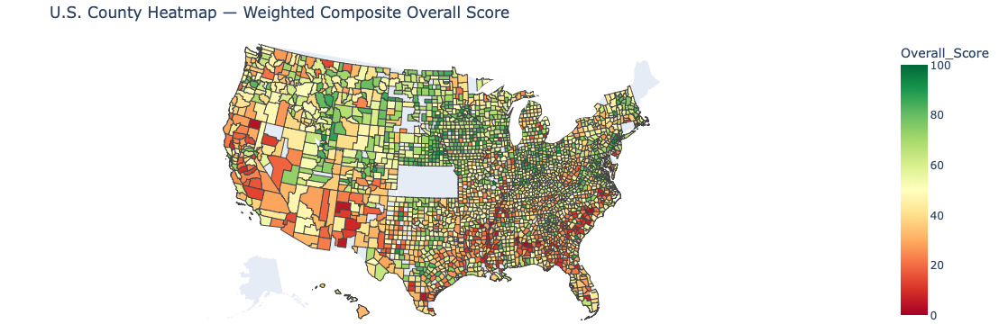

In [106]:
#loading counties in with there boundaries
with open("counties.json") as f:
    counties = json.load(f)
#plots the counties via colors based on overall score,
#and shows hoverdata for a specfic county when you hover over it 

fig = px.choropleth(
    df,
    geojson=counties,
    locations="FIPS",
    color="Overall_Score",
    color_continuous_scale="RdYlGn",#red yellow green scaling
    range_color=(0, 100),
    scope="usa",
    hover_data={
        "CountyName_clean": True,
        "State": True,
        "FIPS": True,
        "population": True,

        "Safety_Score": True,
        "School_Score": True,
        "Economic_Score": True,

        "Overall_Score": True,
        "Overall_Grade": True,
    }
)
#layout settings
fig.update_layout(
    title="U.S. County Heatmap — Weighted Composite Overall Score",
    margin={"r":0, "t":40, "l":10, "b":0}
)

fig.show()
